In [1]:
import imageio
import pickle
import pandas as pd
import numpy as np
import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit

In [2]:
plt.rcParams['figure.figsize'] = [5.0, 4.5]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 10

plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 5

In [3]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [5]:
#Horizontal Scan No Space Charge

# Create dd dictionary
dd3 = dict()

#Case = 'V'
Case = 'H'

if Case is 'V':
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_10/output/output.mat', '6.10')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_11/output/output.mat', '6.11')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_12/output/output.mat', '6.12')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_13/output/output.mat', '6.13')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_14/output/output.mat', '6.14')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_15/output/output.mat', '6.15')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_16/output/output.mat', '6.16')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_17/output/output.mat', '6.17')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_18/output/output.mat', '6.18')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_19/output/output.mat', '6.19')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_20/output/output.mat', '6.20')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_21/output/output.mat', '6.21')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_22/output/output.mat', '6.22')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_23/output/output.mat', '6.23')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_24/output/output.mat', '6.24')
    sc = 'SbS'   
    legend_label = r'Q$_y$'
elif Case is 'H':
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_07/output/output.mat', '6.07')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_08/output/output.mat', '6.08')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_09/output/output.mat', '6.09')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_10/output/output.mat', '6.10')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_11/output/output.mat', '6.11')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_12/output/output.mat', '6.12')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_13/output/output.mat', '6.13')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_14/output/output.mat', '6.14')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_15/output/output.mat', '6.15')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_16/output/output.mat', '6.16')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_17/output/output.mat', '6.17')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_18/output/output.mat', '6.18')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_19/output/output.mat', '6.19')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_20/output/output.mat', '6.20')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_21/output/output.mat', '6.21')
    sc = 'SbS'
    legend_label = r'Q$_x$'
else: 
    print 'Case not recognised, options are \'V\' or \'H\'. Exiting'
    exit(0)
    
main_label = 'Mini_Scan'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
turn_tot = 2200
zoom_turns = 15
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
betagamma = 2.492104532 * 0.9159915293879255

	Added output data from  04_SbS_Tomo_Lattice_H_07/output/output.mat 	 dictionary key:  6.07
	Added output data from  04_SbS_Tomo_Lattice_H_08/output/output.mat 	 dictionary key:  6.08
	Added output data from  04_SbS_Tomo_Lattice_H_09/output/output.mat 	 dictionary key:  6.09
	Added output data from  04_SbS_Tomo_Lattice_H_10/output/output.mat 	 dictionary key:  6.10
	Added output data from  04_SbS_Tomo_Lattice_H_11/output/output.mat 	 dictionary key:  6.11
	Added output data from  04_SbS_Tomo_Lattice_H_12/output/output.mat 	 dictionary key:  6.12
	Added output data from  04_SbS_Tomo_Lattice_H_13/output/output.mat 	 dictionary key:  6.13
	Added output data from  04_SbS_Tomo_Lattice_H_14/output/output.mat 	 dictionary key:  6.14
	Added output data from  04_SbS_Tomo_Lattice_H_15/output/output.mat 	 dictionary key:  6.15
	Added output data from  04_SbS_Tomo_Lattice_H_16/output/output.mat 	 dictionary key:  6.16
	Added output data from  04_SbS_Tomo_Lattice_H_17/output/output.mat 	 dictionary

In [6]:
dd3['6.07'].keys()

['eps_z',
 'D_x',
 'D_y',
 'kurtosis_yp_6sig',
 'kurtosis_yp',
 'mu_yp',
 'kurtosis_z_6sig',
 'eff_beta_y',
 'eff_beta_x',
 'eff_alpha_y',
 'kurtosis_y_6sig',
 'epsn_y',
 'epsn_x',
 'beta_y',
 'beta_x',
 'dpp_rms',
 'sig_yp',
 'min_dE',
 'turn_time',
 'n_mp',
 'min_xp',
 'kurtosis_y',
 'kurtosis_xp_6sig',
 'alpha_x',
 'alpha_y',
 'bunchlength',
 '__header__',
 'sig_xp',
 'kurtosis_dE_6sig',
 'max_xp',
 'intensity',
 'min_yp',
 'sig_dE',
 'min_x',
 'min_y',
 'mu_y',
 'mu_x',
 'cumulative_time',
 'mean_yp',
 'kurtosis_xp',
 'eff_epsn_y',
 'eff_epsn_x',
 'mean_x',
 'mean_y',
 'mean_z',
 'kurtosis_x_6sig',
 '__version__',
 'max_z',
 'mu_dE',
 'max_x',
 'max_y',
 'mean_dE',
 'sig_z',
 'sig_y',
 'sig_x',
 'max_yp',
 'kurtosis_z',
 'eff_alpha_x',
 'kurtosis_x',
 'mu_xp',
 'turn_duration',
 'mu_z',
 'mean_xp',
 'min_z',
 'kurtosis_dE',
 '__globals__',
 'turn',
 'max_dE',
 'gamma']

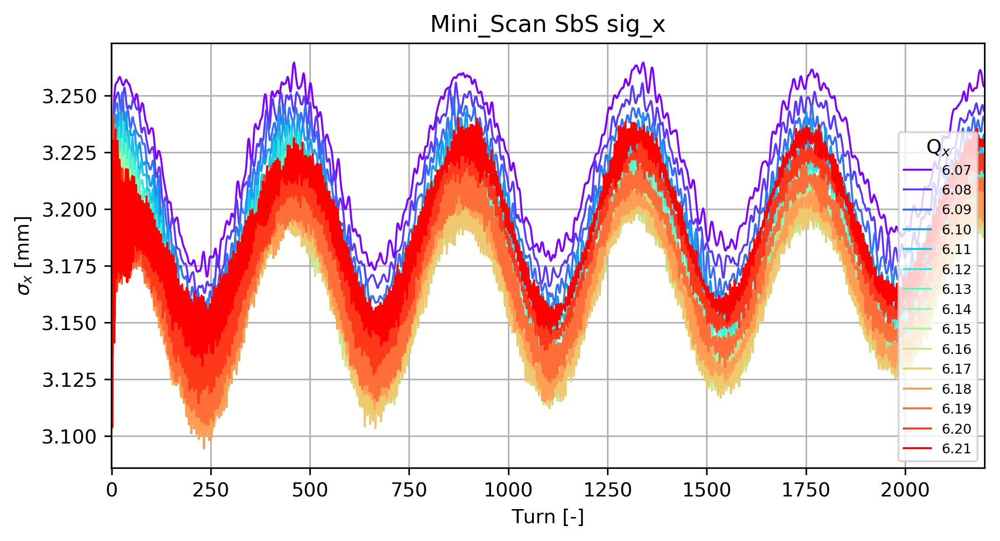

In [7]:
parameter = 'sig_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sigma_x$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)

ax1.grid(lw=0.5, ls=':');
ax1.set_xlim(-1,2200)

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

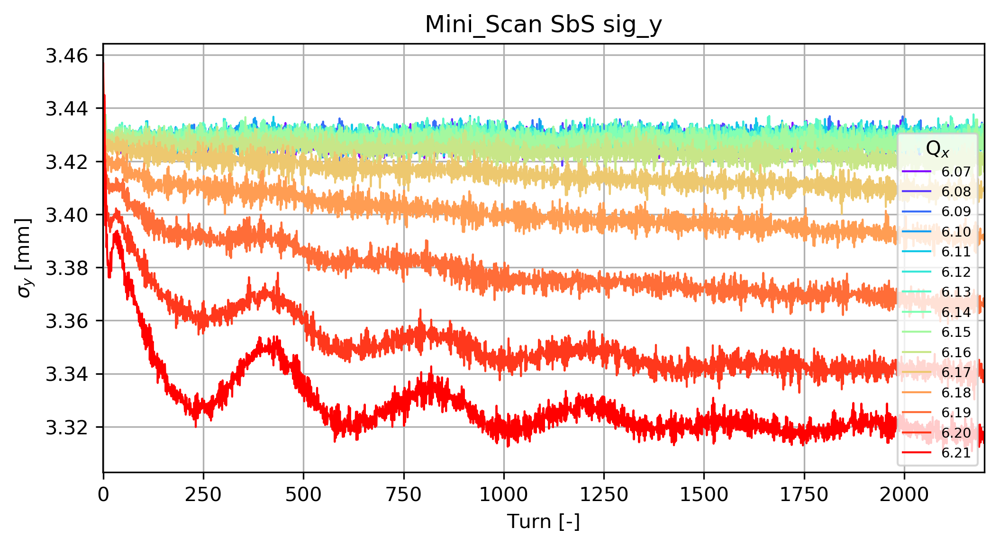

In [8]:
parameter = 'sig_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sigma_y$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

Started loop for tune  6.07
Started loop for tune  6.08
Started loop for tune  6.09
Started loop for tune  6.10
Started loop for tune  6.11
Started loop for tune  6.12
Started loop for tune  6.13
Started loop for tune  6.14
Started loop for tune  6.15
Started loop for tune  6.16
Started loop for tune  6.17
Started loop for tune  6.18
Started loop for tune  6.19
Started loop for tune  6.20
Started loop for tune  6.21


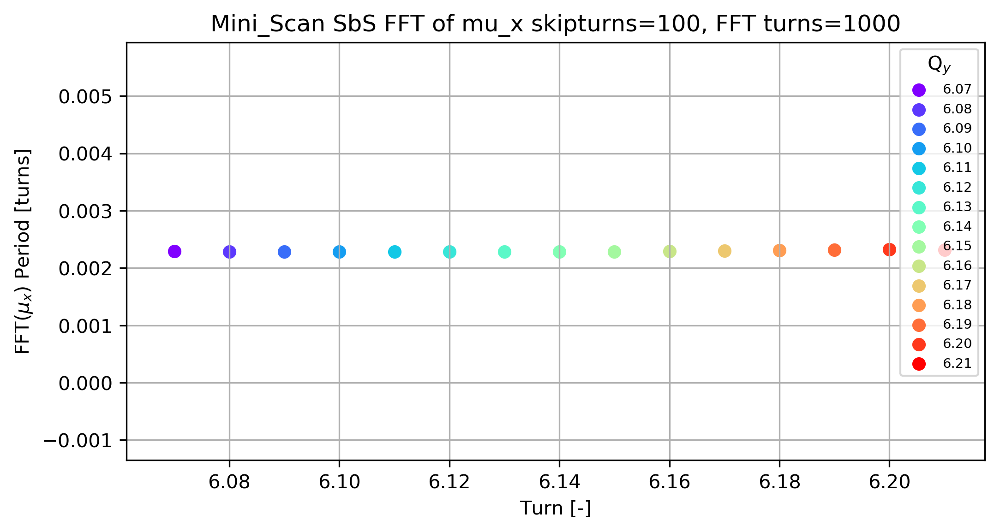

In [46]:
parameter = 'mu_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

trns = 1000
skiptrns = 100
tit = main_label + ' ' + sc + ' FFT of ' + parameter + ' skipturns=' +str(skiptrns)+ ', FFT turns=' + str(trns)
ax1.set_title(tit);

ax1.set_ylabel(r'FFT($\mu_x$) Period [turns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
    print 'Started loop for tune ', key
    y = (dd3[key][parameter][0]-np.mean(dd3[key][parameter][0]))
    try:
        freq = pnf.naff(y, turns=trns, nterms=1, skipTurns=skiptrns, getFullSpectrum=False, window=1)[0][1]
        ax1.scatter(float(key), freq, label=str(key), color=colors[c_it])
    except IndexError:
        continue    
    c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=1, title=legend_label)
ax1.grid()
#ax1.set_xlim(-1,50)

savename = 'Plots/FFT_' + parameter + '_H_Period.png'
plt.savefig(savename, dpi = 800);

Started loop for tune  6.07
Started loop for tune  6.08
Started loop for tune  6.09
Started loop for tune  6.10
Started loop for tune  6.11
Started loop for tune  6.12
Started loop for tune  6.13
Started loop for tune  6.14
Started loop for tune  6.15
## PyNAFF::naff: Remove the DC component from the data (i.e. the mean).
Started loop for tune  6.16
## PyNAFF::naff: Remove the DC component from the data (i.e. the mean).
Started loop for tune  6.17
## PyNAFF::naff: Remove the DC component from the data (i.e. the mean).
Started loop for tune  6.18
## PyNAFF::naff: Remove the DC component from the data (i.e. the mean).
Started loop for tune  6.19
## PyNAFF::naff: Remove the DC component from the data (i.e. the mean).
Started loop for tune  6.20
## PyNAFF::naff: Remove the DC component from the data (i.e. the mean).
Started loop for tune  6.21


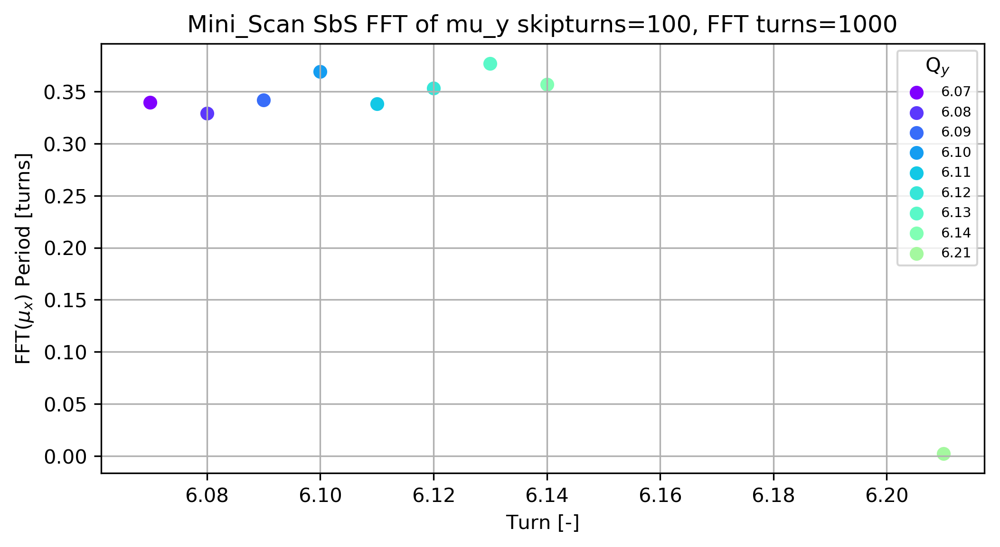

In [47]:
parameter = 'mu_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

trns = 1000
skiptrns = 100
tit = main_label + ' ' + sc + ' FFT of ' + parameter + ' skipturns=' +str(skiptrns)+ ', FFT turns=' + str(trns)
ax1.set_title(tit);

ax1.set_ylabel(r'FFT($\mu_x$) Period [turns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
    print 'Started loop for tune ', key
    y = (dd3[key][parameter][0]-np.mean(dd3[key][parameter][0]))
    try:
        freq = pnf.naff(y, turns=trns, nterms=1, skipTurns=skiptrns, getFullSpectrum=False, window=1)[0][1]
        ax1.scatter(float(key), freq, label=str(key), color=colors[c_it])
    except IndexError:
        continue    
    c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=1, title=legend_label)
ax1.grid()
#ax1.set_xlim(-1,50)

savename = 'Plots/FFT_' + parameter + '_H_Period.png'
plt.savefig(savename, dpi = 800);

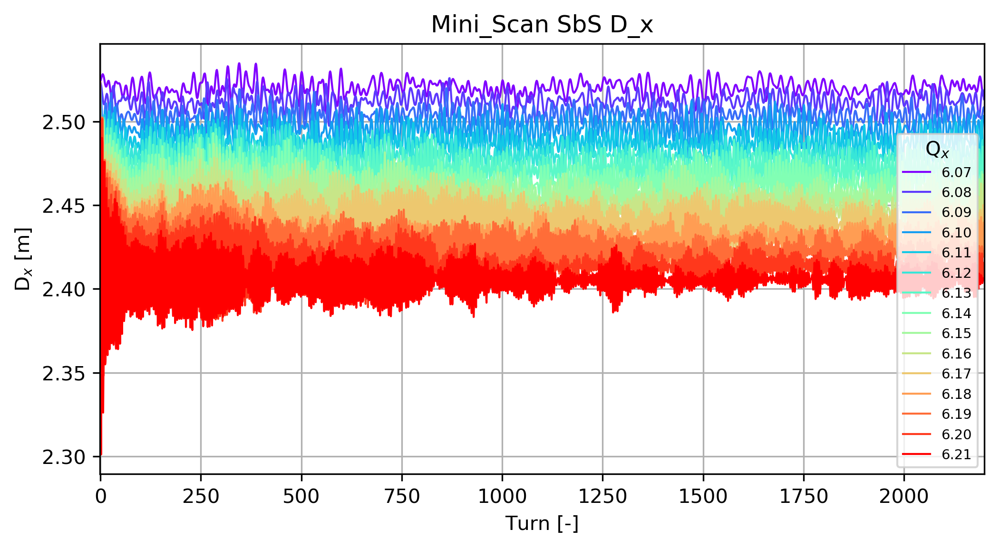

In [9]:
parameter = 'D_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

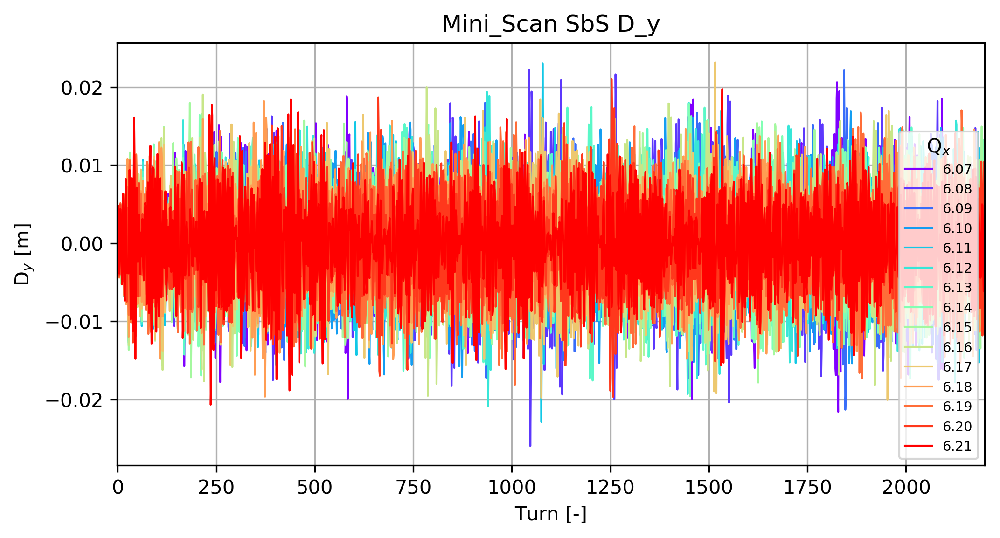

In [10]:
parameter = 'D_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

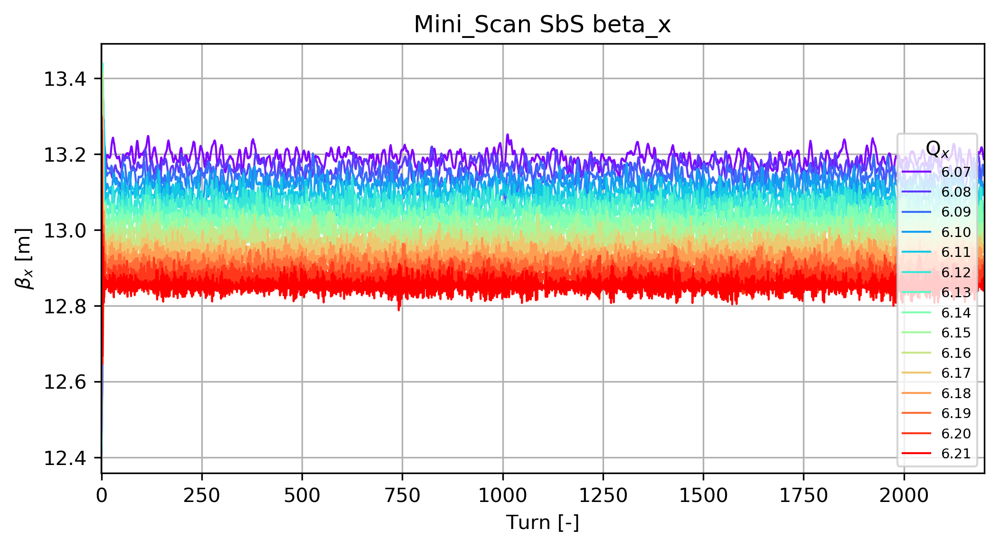

In [11]:
parameter = 'beta_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

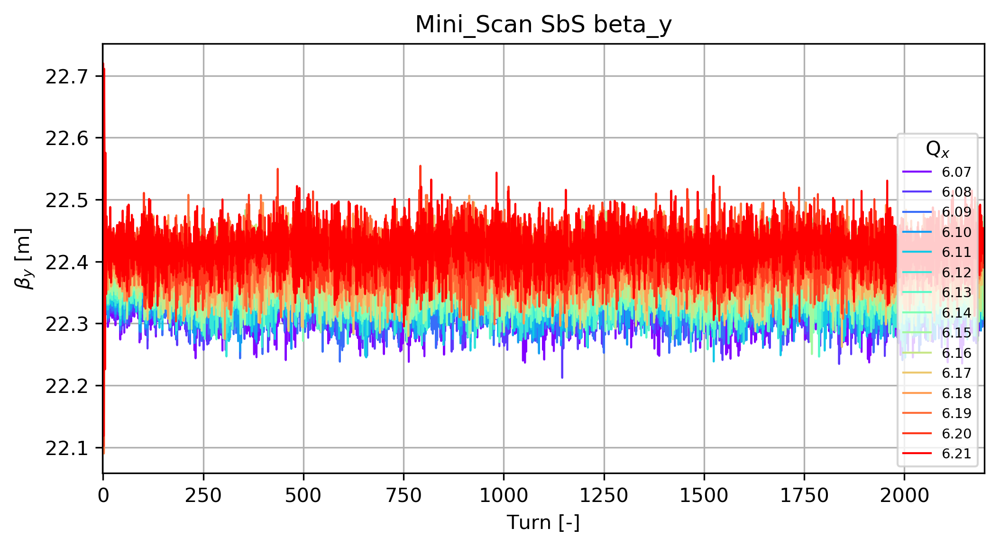

In [12]:
parameter = 'beta_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

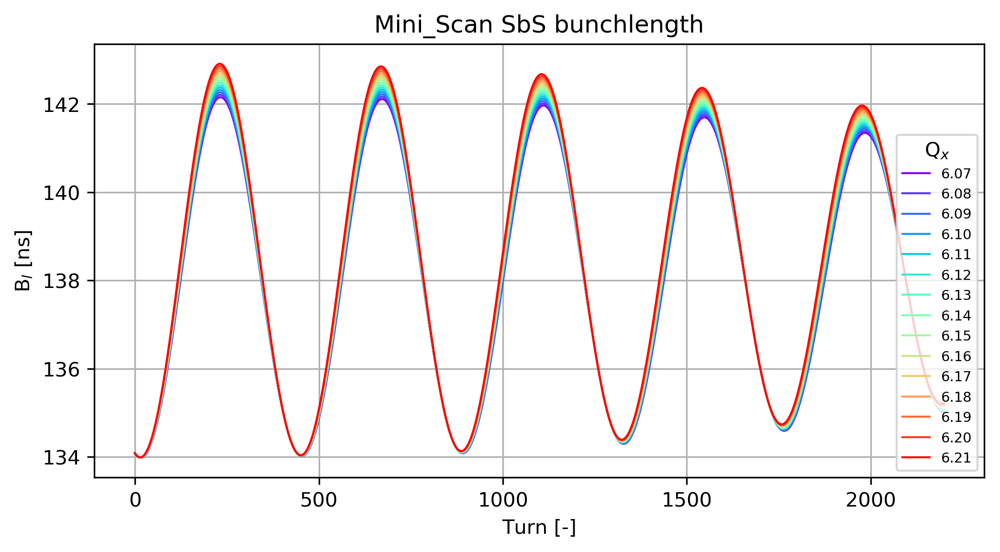

In [13]:
parameter = 'bunchlength'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'B$_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1E9, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
#ax1.set_xlim(-1,10);
#ax1.set_ylim(125,150)

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

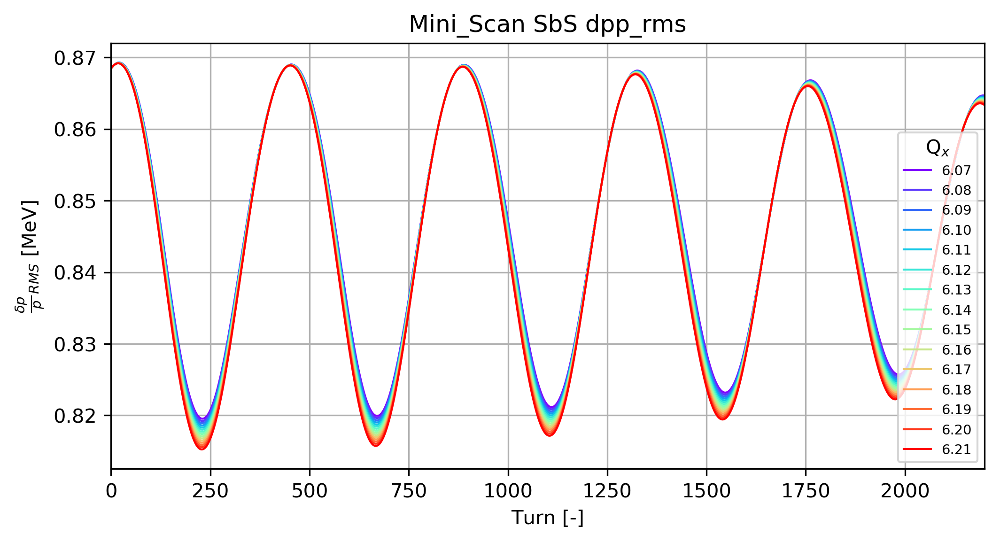

In [14]:
parameter = 'dpp_rms'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [MeV]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

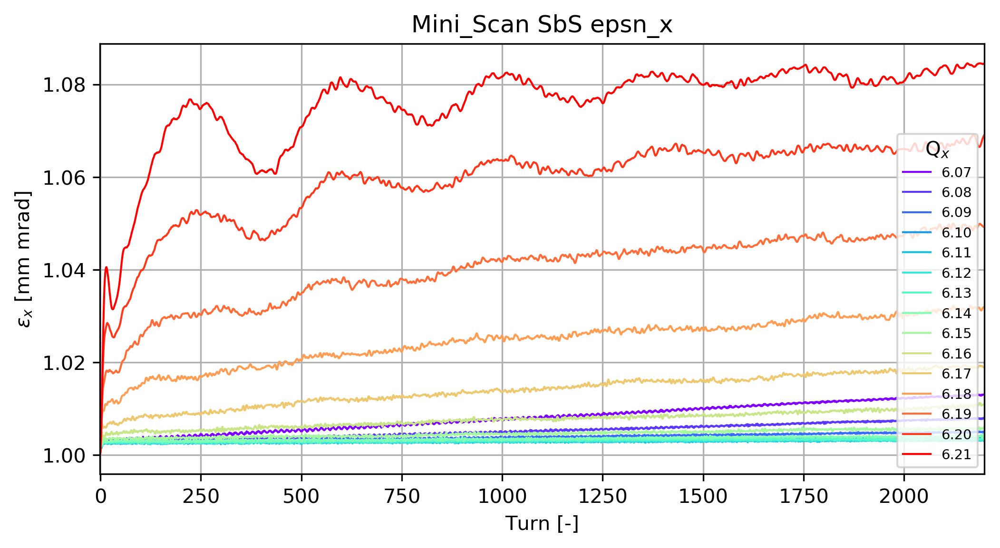

In [15]:
parameter = 'epsn_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
#ax1.set_ylim(0.9, 3.2)

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

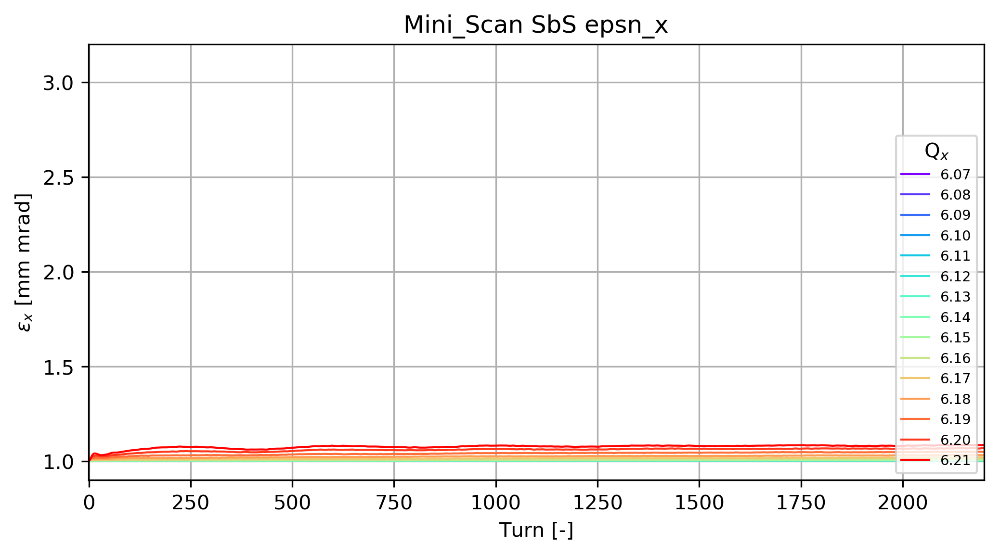

In [17]:
parameter = 'epsn_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(0.9, 3.2)

savename = 'Plots/PFW_Param_' + parameter + '_H_scaled.png'
plt.savefig(savename, dpi = 800);

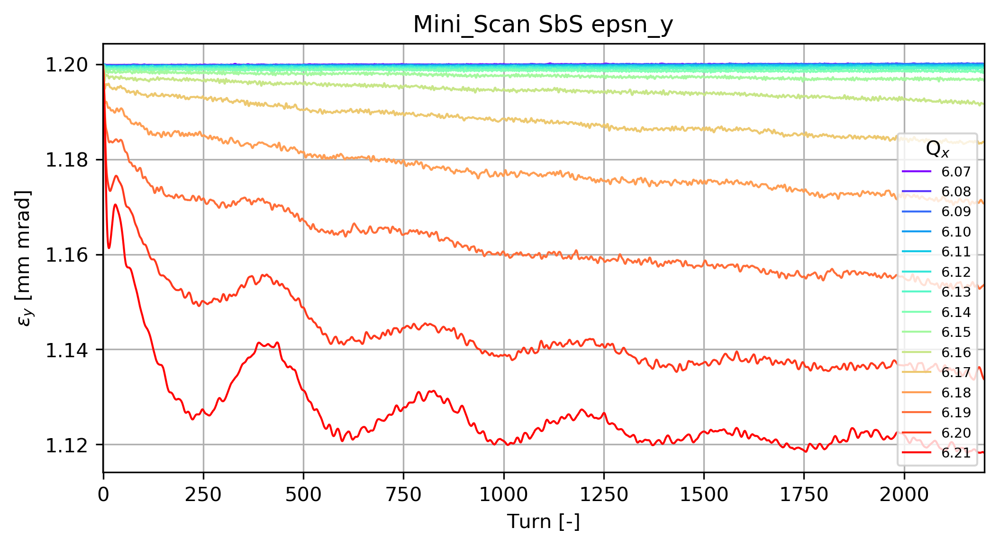

In [18]:
parameter = 'epsn_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
#ax1.set_ylim(0.95, 1.25)

savename = 'Plots/PFW_Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

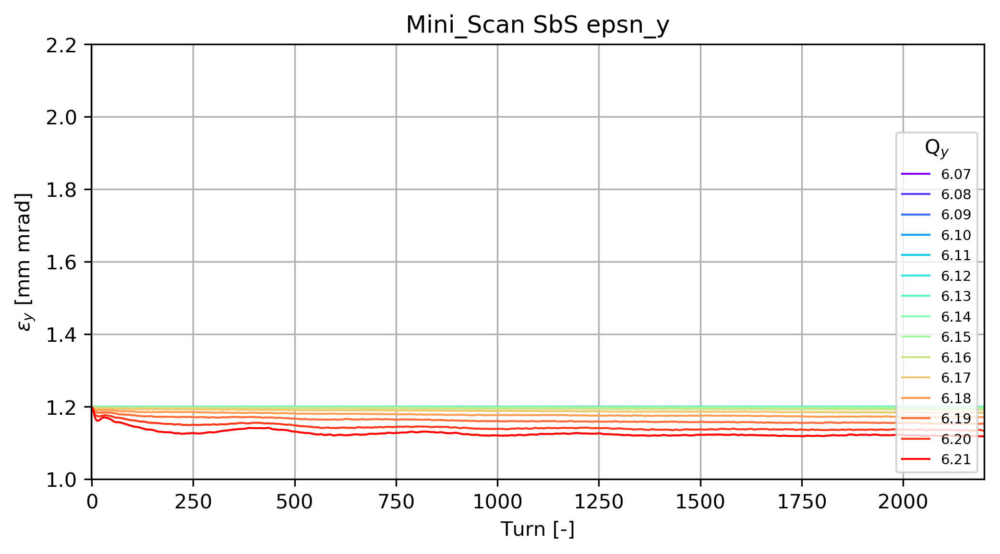

In [48]:
parameter = 'epsn_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)

for key, value in sorted(dd3.iteritems()):
        ax1.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(1, 2.2)

savename = 'Plots/PFW_Param_' + parameter + '_H_scaled.png'
plt.savefig(savename, dpi = 800);

# Vertical Scan No Space Charge

In [4]:
#Horizontal Scan No Space Charge

# Create dd dictionary
dd2 = dict()

Case = 'V'
#Case = 'H'

if Case is 'V':
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_10/output/output.mat', '6.10')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_11/output/output.mat', '6.11')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_12/output/output.mat', '6.12')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_13/output/output.mat', '6.13')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_14/output/output.mat', '6.14')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_15/output/output.mat', '6.15')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_16/output/output.mat', '6.16')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_17/output/output.mat', '6.17')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_18/output/output.mat', '6.18')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_19/output/output.mat', '6.19')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_20/output/output.mat', '6.20')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_21/output/output.mat', '6.21')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_22/output/output.mat', '6.22')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_23/output/output.mat', '6.23')
    dd2 = add_input_file(dd2, '03_SbS_Tomo_Lattice_V_24/output/output.mat', '6.24')
    sc = 'SbS'   
    legend_label = r'Q$_y$'
elif Case is 'H':
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_07/output/output.mat', '6.07')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_08/output/output.mat', '6.08')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_09/output/output.mat', '6.09')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_10/output/output.mat', '6.10')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_11/output/output.mat', '6.11')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_12/output/output.mat', '6.12')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_13/output/output.mat', '6.13')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_14/output/output.mat', '6.14')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_15/output/output.mat', '6.15')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_16/output/output.mat', '6.16')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_17/output/output.mat', '6.17')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_18/output/output.mat', '6.18')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_19/output/output.mat', '6.19')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_20/output/output.mat', '6.20')
    dd3 = add_input_file(dd3, '04_SbS_Tomo_Lattice_H_21/output/output.mat', '6.21')
    sc = 'SbS'
    legend_label = r'Q$_x$'
else: 
    print 'Case not recognised, options are \'V\' or \'H\'. Exiting'
    exit(0)
    
main_label = 'PFW Vertical'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
turn_tot = 2200
zoom_turns = 15
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
betagamma = 2.492104532 * 0.9159915293879255

	Added output data from  03_SbS_Tomo_Lattice_V_10/output/output.mat 	 dictionary key:  6.10
	Added output data from  03_SbS_Tomo_Lattice_V_11/output/output.mat 	 dictionary key:  6.11
	Added output data from  03_SbS_Tomo_Lattice_V_12/output/output.mat 	 dictionary key:  6.12
	Added output data from  03_SbS_Tomo_Lattice_V_13/output/output.mat 	 dictionary key:  6.13
	Added output data from  03_SbS_Tomo_Lattice_V_14/output/output.mat 	 dictionary key:  6.14
	Added output data from  03_SbS_Tomo_Lattice_V_15/output/output.mat 	 dictionary key:  6.15
	Added output data from  03_SbS_Tomo_Lattice_V_16/output/output.mat 	 dictionary key:  6.16
	Added output data from  03_SbS_Tomo_Lattice_V_17/output/output.mat 	 dictionary key:  6.17
	Added output data from  03_SbS_Tomo_Lattice_V_18/output/output.mat 	 dictionary key:  6.18
	Added output data from  03_SbS_Tomo_Lattice_V_19/output/output.mat 	 dictionary key:  6.19
	Added output data from  03_SbS_Tomo_Lattice_V_20/output/output.mat 	 dictionary

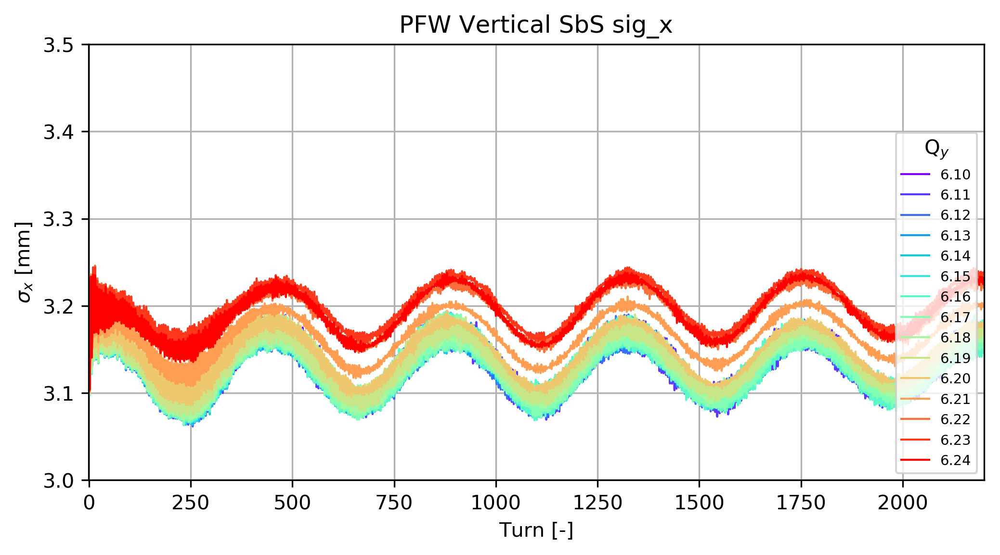

In [33]:
parameter = 'sig_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sigma_x$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)
ax1.set_ylim(3,3.5)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

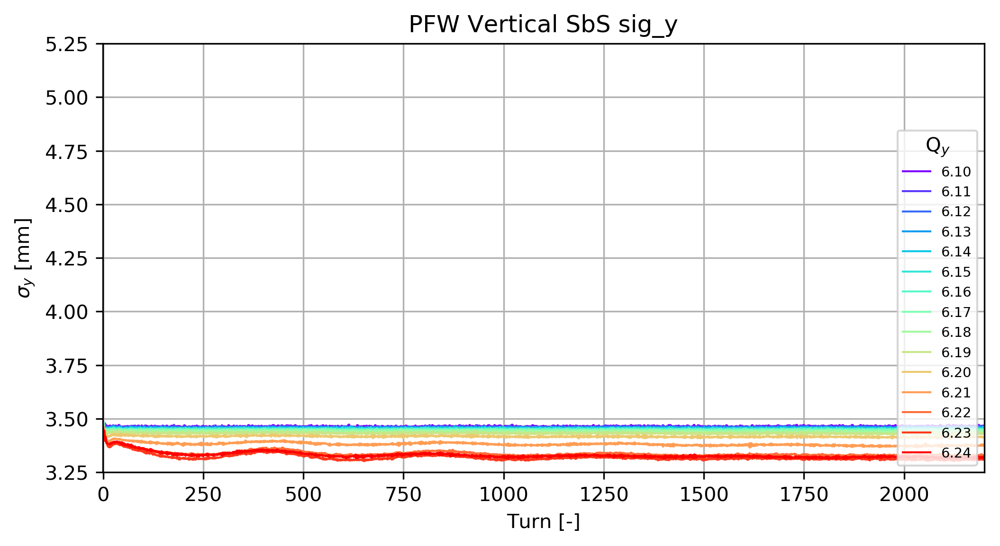

In [34]:
parameter = 'sig_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sigma_y$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)
ax1.set_ylim(3.25, 5.25)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

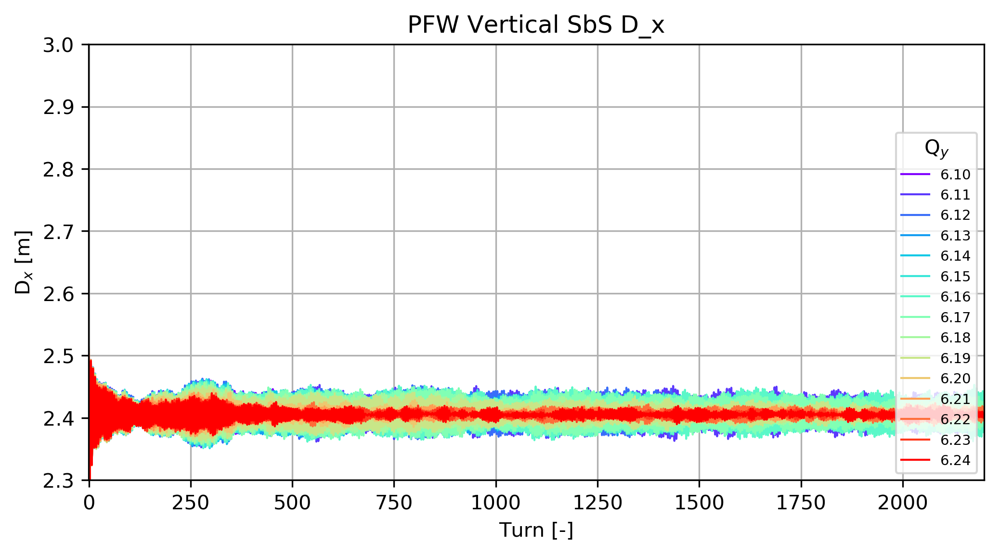

In [22]:
parameter = 'D_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(2.3, 3)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

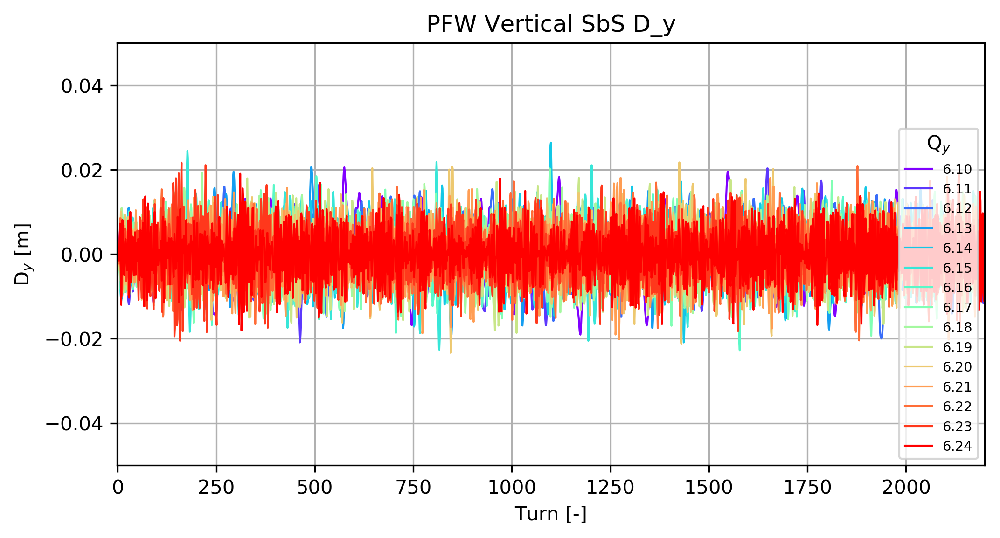

In [23]:
parameter = 'D_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(-0.05, 0.05)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

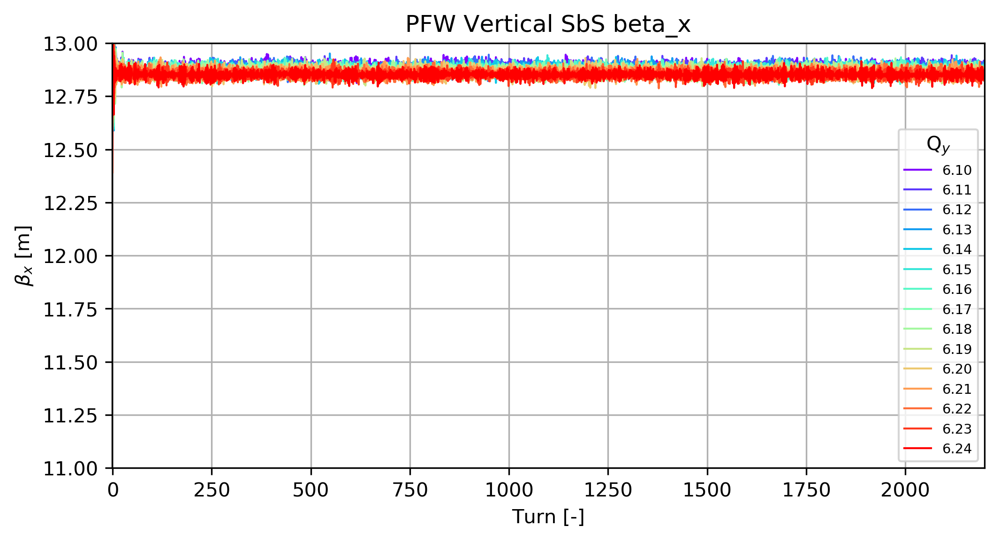

In [18]:
parameter = 'beta_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(11, 13)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

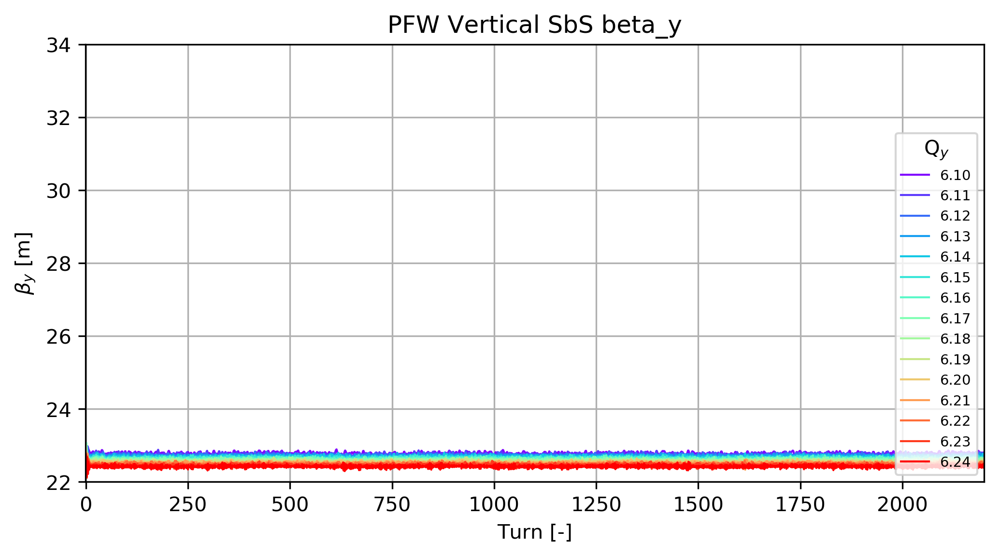

In [20]:
parameter = 'beta_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(22, 34)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

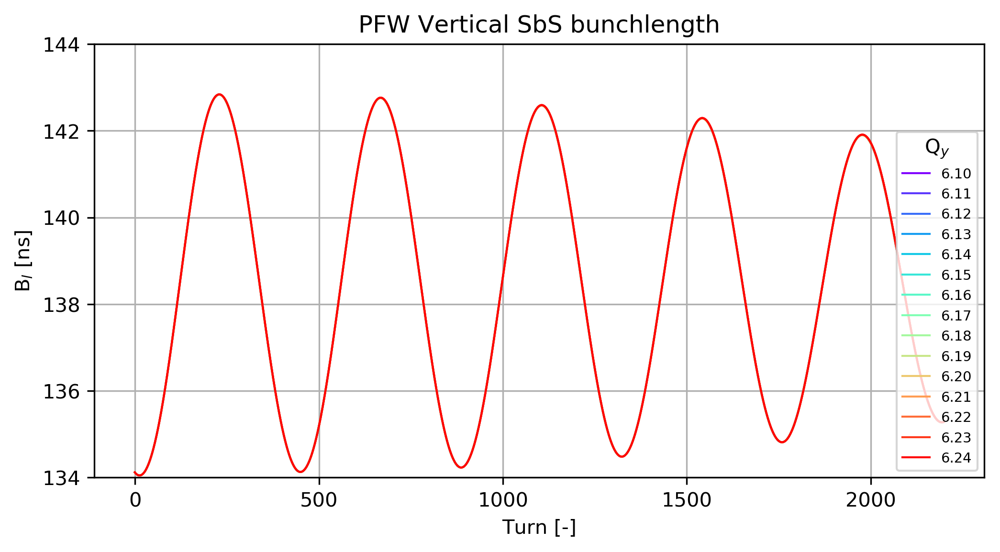

In [25]:
parameter = 'bunchlength'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'B$_l$ [ns]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*1E9, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
#ax1.set_xlim(-1,10);
ax1.set_ylim(134,144)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

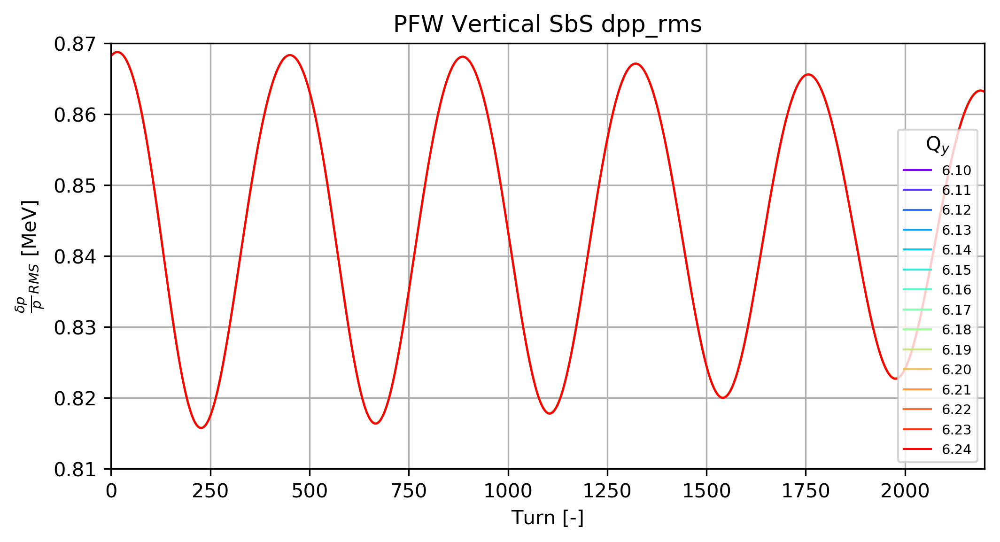

In [28]:
parameter = 'dpp_rms'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [MeV]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(0.81, 0.87)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

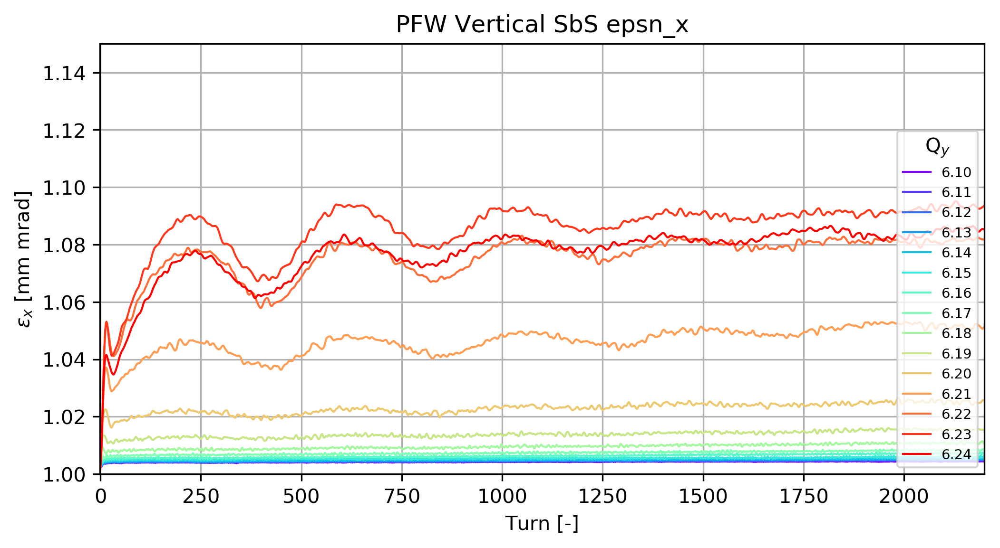

In [29]:
parameter = 'epsn_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(1., 1.15)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

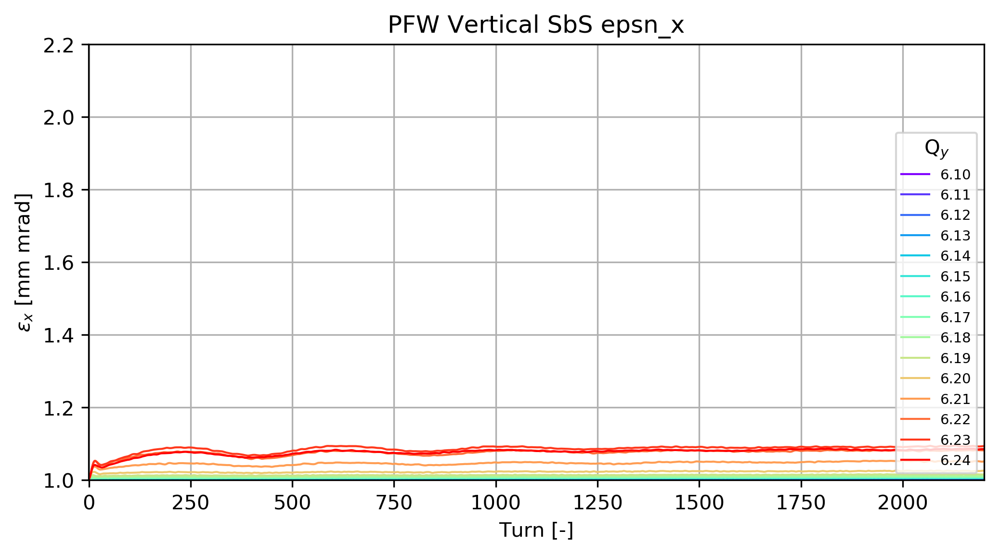

In [31]:
parameter = 'epsn_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(1., 2.2)

savename = 'Plots/PFW_Param_' + parameter + '_V_Montague.png'
plt.savefig(savename, dpi = 800);

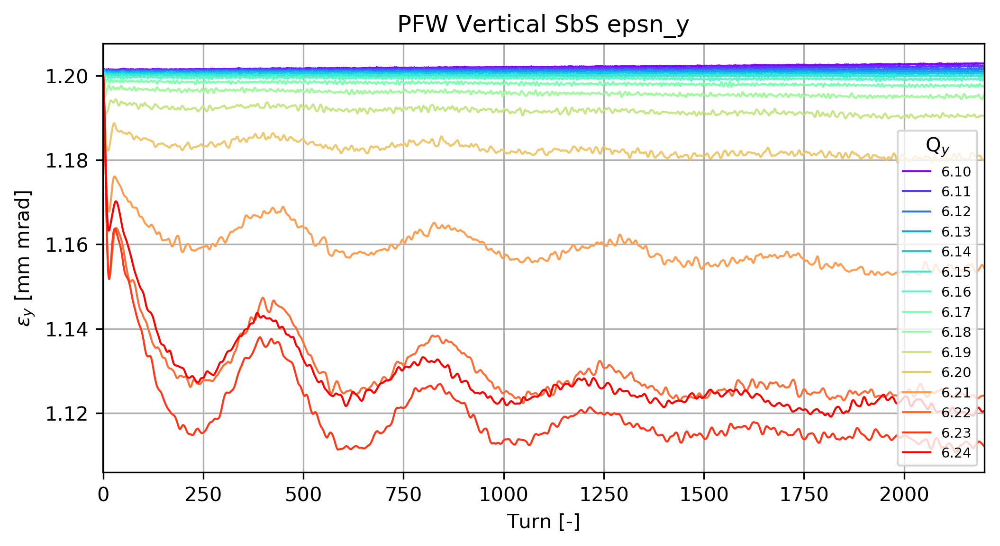

In [16]:
parameter = 'epsn_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
#ax1.set_ylim(0.9, 3.2)

savename = 'Plots/PFW_Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

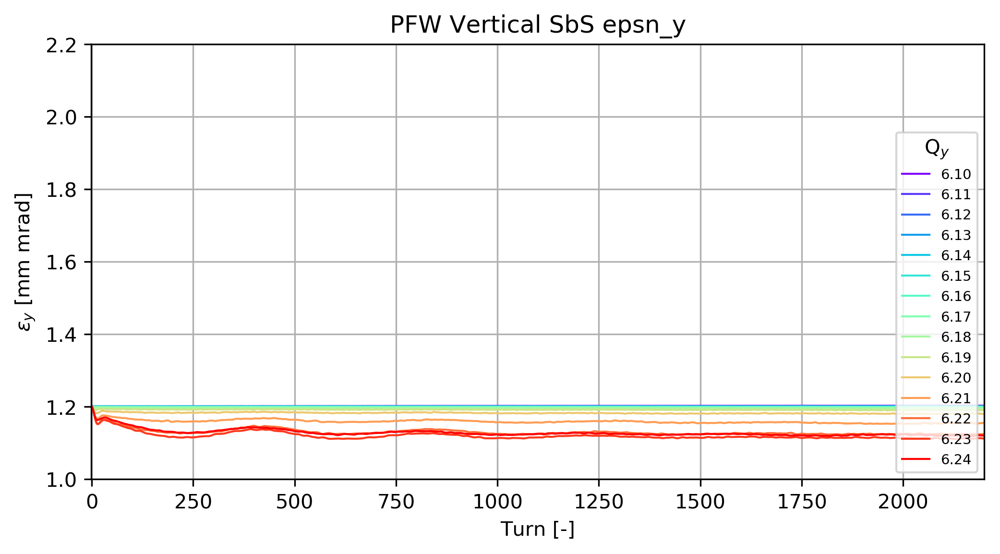

In [32]:
parameter = 'epsn_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)

for key, value in sorted(dd2.iteritems()):
        ax1.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,2200);
ax1.set_ylim(1, 2.2)

savename = 'Plots/PFW_Param_' + parameter + '_V_scaled.png'
plt.savefig(savename, dpi = 800);